## Importing libraries

In [1]:
#%pip install cufflinks

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
from scipy import stats
%matplotlib inline
import cufflinks as cf

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

C:\Users\anurag\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
df = pd.read_csv('C:/Users/anurag/Documents/SIT307/Assignment2/melb_data.csv')
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [4]:
#Filling out the mean values of building areas to replace the NaN values.

df["BuildingArea"].fillna(df["BuildingArea"].median(), inplace=True)
#x = df["BuildingArea"].median()

df["YearBuilt"].fillna(0, inplace=True)

df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,126.0,0.0,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,126.0,0.0,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [5]:
df=df.dropna()
df["Postcode"] = df["Postcode"].astype(int)
df["Propertycount"] = df["Propertycount"].astype(int)
df["Bathroom"] = df["Bathroom"].astype(int)
df["Bedroom2"] = df["Bedroom2"].astype(int)
df["YearBuilt"] = df["YearBuilt"].astype(int)

df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067,...,1,1.0,202.0,126.0,0,Yarra,-37.7996,144.9984,Northern Metropolitan,4019
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067,...,1,0.0,156.0,79.0,1900,Yarra,-37.8079,144.9934,Northern Metropolitan,4019
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067,...,2,0.0,134.0,150.0,1900,Yarra,-37.8093,144.9944,Northern Metropolitan,4019
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067,...,2,1.0,94.0,126.0,0,Yarra,-37.7969,144.9969,Northern Metropolitan,4019
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067,...,1,2.0,120.0,142.0,2014,Yarra,-37.8072,144.9941,Northern Metropolitan,4019


### Some of the data types of the attributes were inappropriate so I have changed them to int values as they need not be float. For the year built, I made it to an integer variable and replaced all the null values with zero. For the building area, I replaced the NaN variables with the median building area of properties all across Melbourne.

In [6]:
#Creating separate columns for month and year so we can do calculations for these individual attributes.
def get_month(m):
    return m.split("/")[1]

def get_year(y):
    return y.split("/")[2]

df["Month"] = df["Date"].apply(lambda x: f"{get_month(x)}")
df["Year"] = df["Date"].apply(lambda x: f"{get_year(x)}")


#df.head()

In [7]:
df["Month"] = pd.to_datetime(df["Month"], format="%m").dt.month_name()

### For further analysis to determine the amount of sales in given months and years, I have created separate attributes called Month and Year, because the exact date would make it more difficult to undergo analysis.

In [8]:
#Visualisation on prices all over Melbourne
fig = px.scatter_mapbox(df,
                        lat="Lattitude",
                        lon="Longtitude",
                        color='Price',
                        mapbox_style='open-street-map',
                        hover_name='Suburb',
                        color_continuous_scale=px.colors.cyclical.Edge)

fig.show()

In [9]:
#Visualisation on prices all over Melbourne, with average price for each suburb.
fig = px.scatter_mapbox(df,
                        lat="Lattitude",
                        lon="Longtitude",
                        color='Price',
                        mapbox_style='open-street-map',
                        hover_name='Suburb',
                        color_continuous_scale=px.colors.cyclical.Edge,
                        size="Price")

fig.show()

In [10]:
#Top 20 Suburbs
df["Suburb"].value_counts()[0:1]

Reservoir    323
Name: Suburb, dtype: int64

In [11]:
#Visualisation on distance from CBD

fig = px.scatter_mapbox(df,
                        lat="Lattitude",
                        lon="Longtitude",
                        color='Distance',
                        mapbox_style='open-street-map',
                        hover_name='Distance',
                        color_continuous_scale=px.colors.cyclical.mrybm)

fig.show()

### The three mapboxes shown above demonstrate the physical location of all the sold properties. The first mapbox shows the prices of each and every single listing between 2016 and 2017 based on colour. The second mapbox shows the average selling price of properties for each suburb, shown by size (large dot means large average price). The last mapbox shows the distances of every property from the CBD.

## Councils

In [12]:
#Which council sold the most properties. It is clear that Moreland has sold the most properties.
(df.groupby("CouncilArea").count().sort_values("Propertycount", ascending=False))["Propertycount"][0:5]

CouncilArea
Moreland         1163
Boroondara       1160
Moonee Valley     997
Darebin           934
Glen Eira         848
Name: Propertycount, dtype: int64

### Moreland has sold the most properties, followed by Boroondara and Moonee Valley.

<Figure size 1440x1296 with 0 Axes>

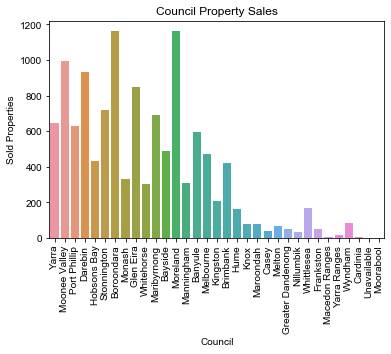

<Figure size 1440x1296 with 0 Axes>

In [13]:
#Visualisation
sns.countplot(x="CouncilArea", data=df)
sns.set_style("dark")
plt.xticks(rotation="vertical")
plt.title("Council Property Sales")
plt.xlabel("Council")
plt.ylabel("Sold Properties")
plt.figure(figsize=(20, 18))

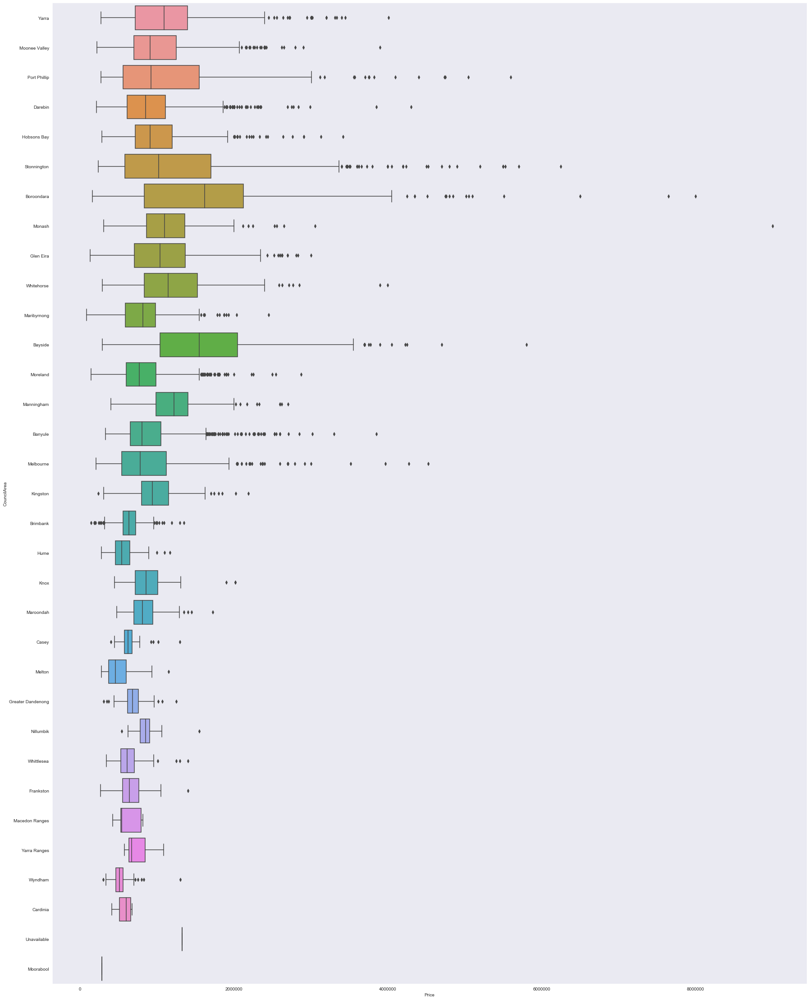

In [14]:
plt.figure(figsize=(30,40))
sns.boxplot(data=df, x=df["Price"], y=df["CouncilArea"])

### Stonnington, Boroondara, Bayside and Port Phillip have large interquartile ranges. Boroondara has the highest median price of properties sold in the area, as well as the largest interquartile range and the largest maximum value.

In [15]:
#Visualisation on distance from CBD

fig = px.scatter_mapbox(df,
                        lat="Lattitude",
                        lon="Longtitude",
                        color='CouncilArea',
                        mapbox_style='open-street-map',
                        hover_name='Suburb',
                        color_continuous_scale=px.colors.cyclical.mrybm)

fig.show()

### This mapbox shows where the councils are based on colour.

In [16]:
fig=px.treemap(df, path=["CouncilArea", "Suburb"])
fig.show()

In [17]:
(df.groupby("CouncilArea").mean().sort_values("Landsize", ascending=False)["Landsize"])[0:1]

CouncilArea
Yarra Ranges    7261.0
Name: Landsize, dtype: float64

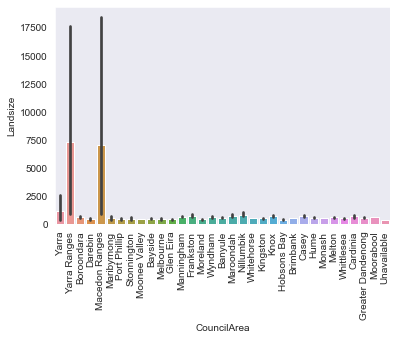

In [18]:
df_size=df.sort_values("Landsize", ascending=False)
sns.barplot(data=df_size, x="CouncilArea", y="Landsize")
plt.xticks(rotation="vertical")
plt.show()

In [19]:
(df.groupby("CouncilArea").mean().sort_values("Price", ascending=False)["Price"])[0:1]

CouncilArea
Bayside    1.652168e+06
Name: Price, dtype: float64

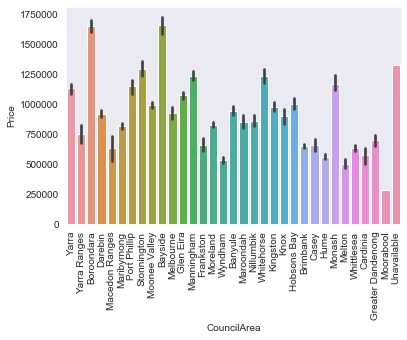

In [20]:
df_price=df.sort_values("Price", ascending=False)
sns.barplot(data=df_size, x="CouncilArea", y="Price")
plt.xticks(rotation="vertical")
plt.show()

### This treemap shows which suburbs are in which council. The larger the box, the more sales there were.

## Room quantity statistics

<Figure size 1440x1296 with 0 Axes>

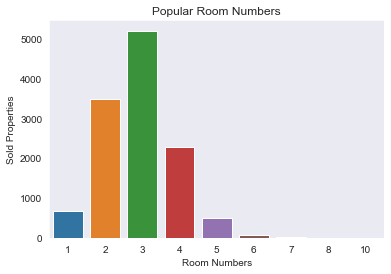

<Figure size 1440x1296 with 0 Axes>

In [21]:
#Which room qunatity is the most common?
sns.countplot(x="Rooms", data=df)
sns.set_style("dark")
plt.title("Popular Room Numbers")
plt.xlabel("Room Numbers")
plt.ylabel("Sold Properties")
plt.figure(figsize=(20, 18))

### Properties with three rooms were the most commonly sold.

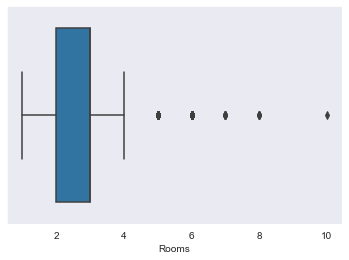

In [22]:
sns.boxplot(x="Rooms", data=df)

### The minimum number of rooms was 1 room and the maximum number of rooms was 4 rooms as per this boxplot.

## Seller statistics

In [23]:
#Top 20 Sellers
df["SellerG"].value_counts()[0:20]

#df.groupby("SellerG").sum().sort_values("Postcode", ascending=False)


Nelson           1445
Jellis           1183
hockingstuart    1073
Barry             885
Ray               589
Marshall          585
Buxton            555
Biggin            371
Brad              318
Woodards          283
Fletchers         261
Jas               228
Greg              224
McGrath           201
Sweeney           201
Miles             190
Noel              178
RT                171
Gary              163
Harcourts         149
Name: SellerG, dtype: int64

### Nelson was the most successful seller, follwed by Jellis Craig and Hocking Stuart.

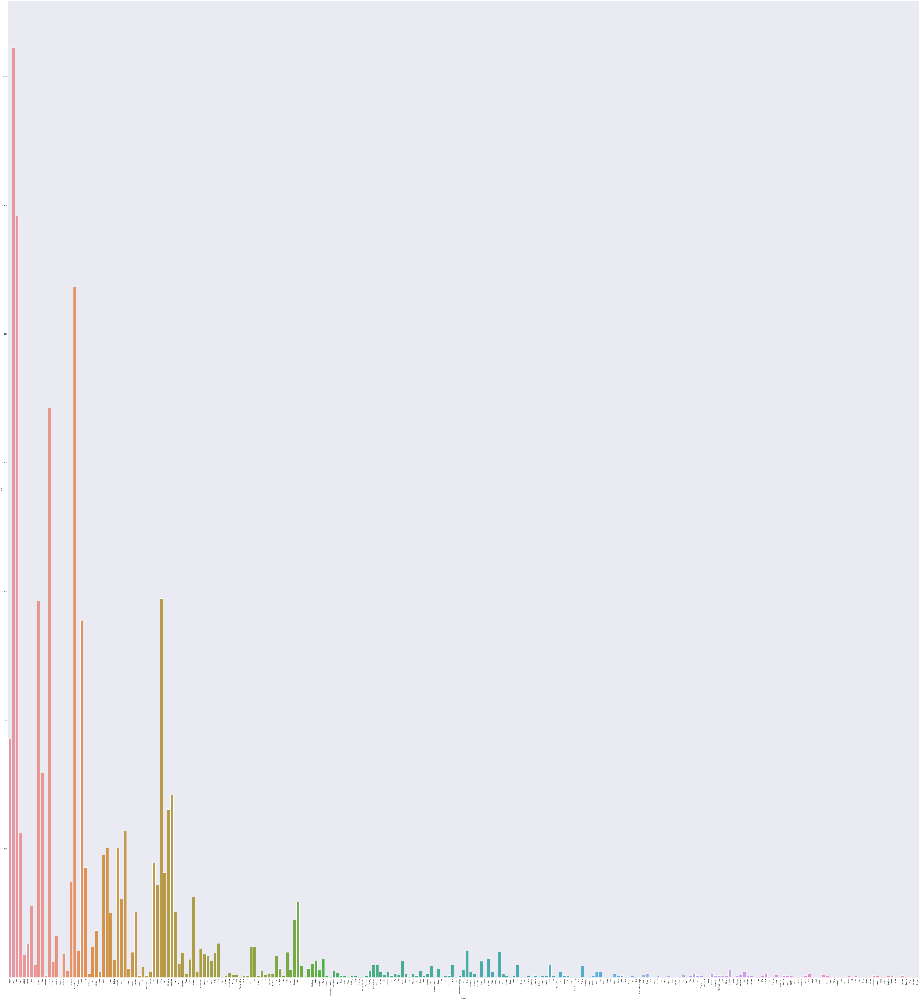

In [24]:
plt.subplots(figsize=(100, 110))
sns.countplot(data=df, x=df["SellerG"])
plt.xticks(rotation="vertical")
plt.show()

### This is a plot showing every single company in Melbourne and how successful they were.

In [25]:
fig = px.scatter_mapbox(df,
                        lat="Lattitude",
                        lon="Longtitude",
                        color='SellerG',
                        mapbox_style='open-street-map',
                        hover_name='SellerG',
                        color_continuous_scale=px.colors.cyclical.IceFire,
                        )

fig.show()

### Map showing the sellers of each property based on colour.

### Most common types of properties

In [26]:
px.pie(df, df["Type"], hole=0.3)

In [27]:
fig = px.scatter_mapbox(df, lat="Lattitude", lon="Longtitude", color="Type", hover_name='Suburb', mapbox_style='open-street-map',
                        color_continuous_scale=px.colors.cyclical.IceFire)
fig.show()

### Map shows the types of properties and where they were sold.

### Houses were the most highly sold, with townhouses in second and units in third place.

In [28]:
# Most successful month in 2016
((df.loc[df["Year"] == "2016"]).groupby("Month").count().sort_values("Propertycount", ascending=False))["Propertycount"][0:1]

Month
November    1114
Name: Propertycount, dtype: int64

### November was the most successful month in 2016, with 1114 sales.

<Figure size 1440x1296 with 0 Axes>

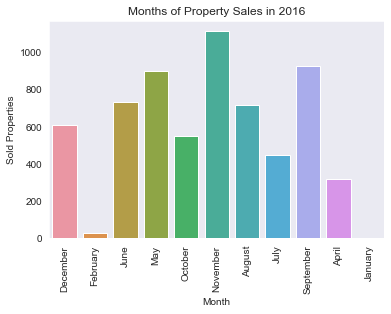

<Figure size 1440x1296 with 0 Axes>

In [29]:
df2016 = df.loc[df["Year"] == "2016"]
sns.countplot(x="Month", data=df2016)
sns.set_style("dark")
plt.xticks(rotation="vertical")
plt.title("Months of Property Sales in 2016")
plt.xlabel("Month")
plt.ylabel("Sold Properties")
plt.figure(figsize=(20, 18))

In [30]:
# Most successful month in 2017
((df.loc[df["Year"] == "2017"]).groupby("Month").count().sort_values("Propertycount", ascending=False))["Propertycount"][0:1]

Month
July    1535
Name: Propertycount, dtype: int64

### July was the most successful month in 2017 with 1535 sales.

<Figure size 1440x1296 with 0 Axes>

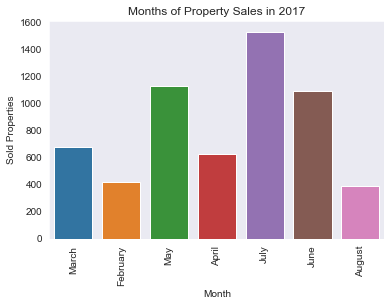

<Figure size 1440x1296 with 0 Axes>

In [31]:
df2017 = df.loc[df["Year"] == "2017"]
sns.countplot(x="Month", data=df2017)
sns.set_style("dark")
plt.xticks(rotation="vertical")
plt.title("Months of Property Sales in 2017")
plt.xlabel("Month")
plt.ylabel("Sold Properties")
plt.figure(figsize=(20, 18))

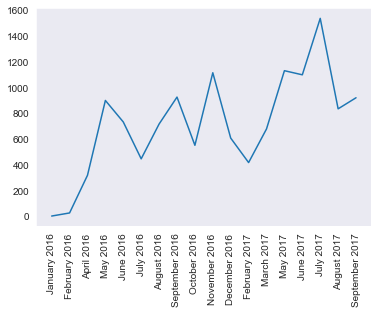

In [32]:
#Graphing sales trends
df["Month/Year"] = df["Month"] + " " + df["Year"]

#x = df["Month/Year"].value_counts()
x = ["January 2016", "February 2016", "April 2016", "May 2016", "June 2016", "July 2016", "August 2016", "September 2016", 
     "October 2016", "November 2016", "December 2016", "February 2017", "March 2017", "May 2017", "June 2017",
    "July 2017", "August 2017", "September 2017"]

y = [2, 26, 318, 899, 732, 446, 716, 925, 551, 1114, 607, 417, 678, 1130, 1098, 1536, 834, 920, ]


plt.plot(x, y)
sns.set_style("dark")
plt.xticks(rotation="vertical")
plt.show()

### The plot shows how many properties were sold each month as shown in the dataset, based on month and year.

### Most popular region name

In [33]:
df["Regionname"].value_counts()

Southern Metropolitan         4340
Northern Metropolitan         3554
Western Metropolitan          2668
Eastern Metropolitan          1229
South-Eastern Metropolitan     325
Eastern Victoria                44
Northern Victoria               26
Western Victoria                25
Name: Regionname, dtype: int64

### Southern Metropolian was the region with the most sales.

In [34]:
px.pie(df, df["Regionname"], hole=0.3)

### This ring chart shows the percentage of properties sold in each of the administrative regions.

In [35]:
fig=px.treemap(df, path=['Regionname', 'Suburb'])
fig.show()

### This treemap shows which suburbs are in which administrative region. It also shows, based on the size of the box, how many sales there were.

In [36]:
fig = px.scatter_mapbox(df,
                        lat="Lattitude",
                        lon="Longtitude",
                        color='Regionname',
                        mapbox_style='open-street-map',
                        hover_name='Suburb',
                        color_continuous_scale=px.colors.cyclical.IceFire,
                        )

fig.show()

### The above map shows where the administrative regions are.

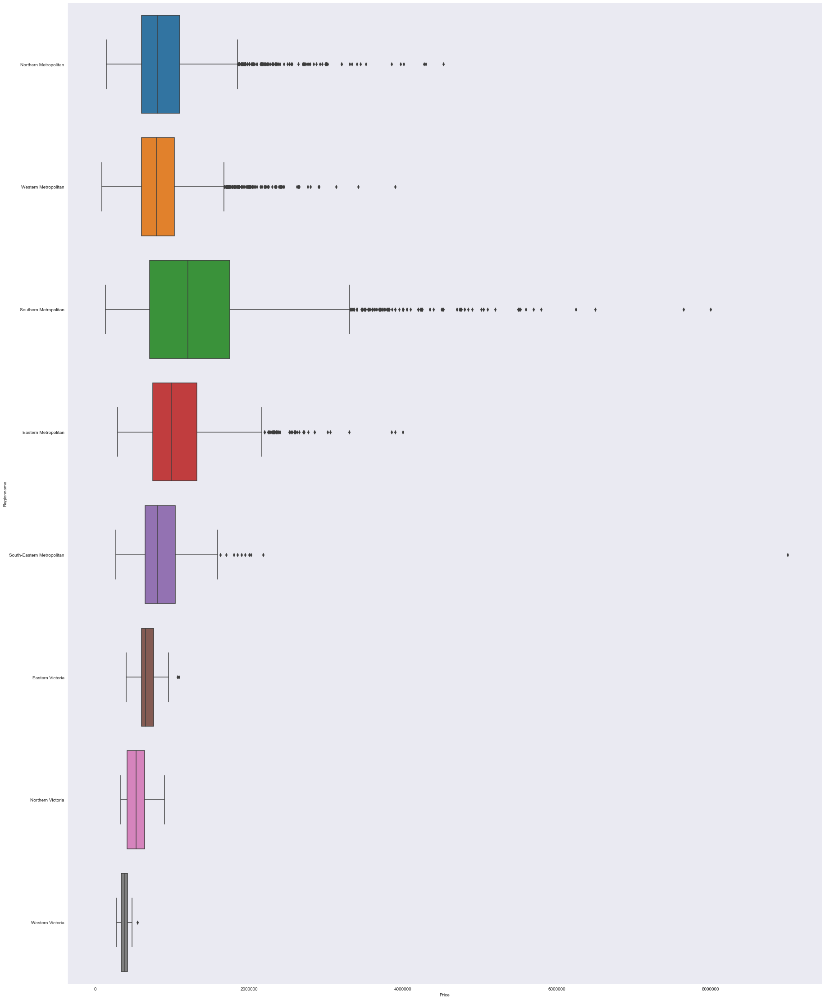

In [37]:
plt.figure(figsize=(30,40))
sns.boxplot(data=df, x=df["Price"], y=df["Regionname"])

### The box plot even shows that the Southern Metropolitan area has the highest median price and maximum price.

In [38]:
#(df.groupby("Regionname").mean().sort_values("Landsize", ascending=False))["Landsize"][0:1]


(df.groupby("Regionname").mean().sort_values("Landsize", ascending=False))["Landsize"]


Regionname
Eastern Victoria              3363.272727
Northern Victoria             2413.307692
Western Victoria               637.680000
Eastern Metropolitan           616.568755
South-Eastern Metropolitan     592.836923
Northern Metropolitan          566.231851
Southern Metropolitan          500.231567
Western Metropolitan           485.396927
Name: Landsize, dtype: float64

### Northern, Eastern and Western Victoria had the lowest number of sales with more land bought while the metropolitan areas had high sales but less land was bought. Also because this is a Melbourne dataset and does not include regional Victoria.

## Types of sales

In [39]:
#df["Method"].value_counts()

px.pie(df, df["Method"], hole=0.3)

### S (property sold) was the most common form of sale method.

### Which suburb had the highest median price?

In [40]:
#Which suburb had the highest median price?
(df.groupby("Suburb").median().sort_values("Price", ascending=False))["Price"][0:1]

Suburb
Eaglemont    1858500.0
Name: Price, dtype: float64

### Eaglemont has the highest median price at $1858500.

### Which suburb had the highest median price (Top 20)?

In [41]:
(df.groupby("Suburb").median().sort_values("Price", ascending=False))["Price"][0:20]

Suburb
Eaglemont           1858500.0
Middle Park         1850000.0
Canterbury          1843000.0
Albert Park         1805500.0
Balwyn              1801000.0
Princes Hill        1800000.0
Kew East            1750000.0
Ivanhoe East        1740000.0
Brighton            1713000.0
Balwyn North        1700000.0
Ashburton           1662000.0
Sandringham         1660000.0
Beaumaris           1660000.0
Glen Iris           1655000.0
Camberwell          1637500.0
Mont Albert         1587000.0
Brighton East       1580000.0
Surrey Hills        1570000.0
North Warrandyte    1550000.0
Malvern             1543000.0
Name: Price, dtype: float64

### Which suburb on average has the largest average size properties?

In [42]:
(df.groupby("Suburb").mean().sort_values("BuildingArea", ascending=False))["BuildingArea"][0:5]

Suburb
Williams Landing    443.000000
Clarinda            375.500000
Pakenham            326.333333
North Warrandyte    321.000000
Riddells Creek      272.400000
Name: BuildingArea, dtype: float64

In [43]:
df_h = df.loc[df["Type"]=="h"]
df_u = df.loc[df["Type"]=="u"]
df_t = df.loc[df["Type"]=="t"]

In [44]:
df_h.groupby("SellerG").count().sort_values("Price", ascending=False)["Price"][0:1]  #Nelson. 85.
df_u.groupby("SellerG").count().sort_values("Price", ascending=False)["Price"][0:1]  #Hocking Stuart. 194.
df_t.groupby("SellerG").count().sort_values("Price", ascending=False)["Price"][0:1]  #Nelson. 85.

SellerG
Nelson    128
Name: Price, dtype: int64

### Nelson sold the highest number of homes at 85. Hocking Stuart sold the highest number of units at 194. Nelson sold the highest number of townhouses at 85.

In [45]:
df_h.groupby("Regionname").count().sort_values("Price", ascending=False)["Price"][0:1]  #Southern Metropolitan. 1220.
df_u.groupby("Regionname").count().sort_values("Price", ascending=False)["Price"][0:1]  #Southern Metropolitan. 742.
df_t.groupby("Regionname").count().sort_values("Price", ascending=False)["Price"][0:1]  #Southern Metropolitan. 204.

Regionname
Southern Metropolitan    399
Name: Price, dtype: int64

In [46]:
df_h.groupby("CouncilArea").count().sort_values("Price", ascending=False)["Price"][0:1]
#The council of Moreland sold the most houses. 842.

CouncilArea
Moreland    842
Name: Price, dtype: int64

In [47]:
df_u.groupby("CouncilArea").count().sort_values("Price", ascending=False)["Price"][0:1]
#The council of Stonnington sold the most units. 358.

CouncilArea
Stonnington    358
Name: Price, dtype: int64

In [48]:
df_t.groupby("CouncilArea").count().sort_values("Price", ascending=False)["Price"][0:1]
#The council of Moreland sold the most houses. 137.

CouncilArea
Moreland    137
Name: Price, dtype: int64

### The Southern Metropolitan region saw the highest number of houses, units and townhouses being sold at 1220 houses, 742 units and 204 townhouses.

In [49]:
px.pie(df_h, df_h["Method"], hole=0.3)

In [50]:
px.pie(df_u, df_u["Method"], hole=0.3)

In [51]:
px.pie(df_t, df_t["Method"], hole=0.3)

In [52]:
df_h.groupby("SellerG").mean().sort_values("Price", ascending=False)["Price"][0:1]  #Hall. 9000000.0.
df_u.groupby("SellerG").mean().sort_values("Price", ascending=False)["Price"][0:1]  #Scott. 1860000.0.
df_t.groupby("SellerG").mean().sort_values("Price", ascending=False)["Price"][0:1]  #Castran. 2175000.0.

SellerG
Castran    2175000.0
Name: Price, dtype: float64

### The pie charts show which selling method was the most common with houses, units and townhouses.

## Selling method

In [53]:
fig = px.scatter_mapbox(df, lat="Lattitude", lon="Longtitude", color="Method", hover_name='Price', mapbox_style='open-street-map',
                        color_continuous_scale=px.colors.cyclical.IceFire)
fig.show()

### Map displays the properties sold and their selling method.

In [54]:
px.pie(df, df["Method"], hole=0.3)

### Ring chart shows that S (sold) was the highest selling method at 66.4%.

## Other data

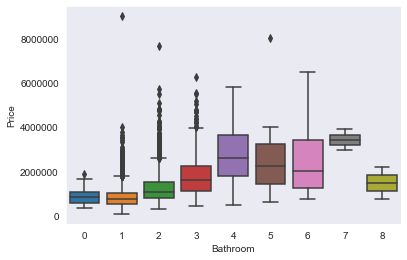

In [55]:
sns.boxplot(data=df, x="Bathroom", y="Price")

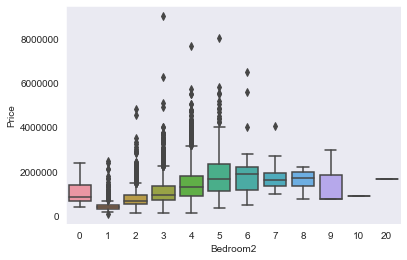

In [56]:
sns.boxplot(data=df, x="Bedroom2", y="Price")

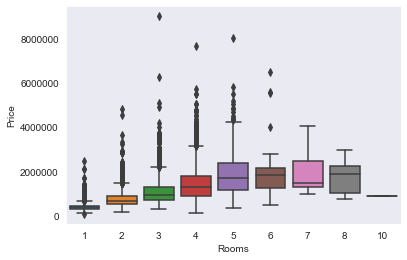

In [57]:
sns.boxplot(data=df, x="Rooms", y="Price")

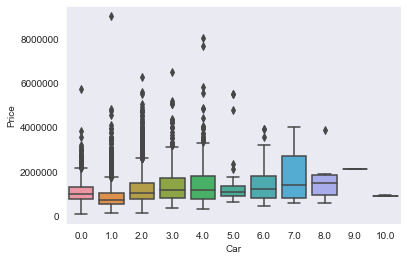

In [58]:
sns.boxplot(data=df, x="Car", y="Price")

## Suburb-based data as well as year-built based data

In [59]:
df.groupby("Suburb").mean().sort_values("Price", ascending=False)["Price"][0:1]
#Canterbury has the highest average property prices.

Suburb
Canterbury    2.159176e+06
Name: Price, dtype: float64

In [60]:
df.sort_values("Price", ascending=False)[0:1]
#We researched the property on realestate.com and the estimated price shown was $989000. 
#So we assumed that the second-most expensive property in this dataset would be the most expensive. 
#After research, the price was confirmed to be a correct approximation.

df.sort_values("Price", ascending=False)[1:2]
#Mulgrave saw the most expensive listing at $*M. Has 3 rooms

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Month,Year,Month/Year
7692,Canterbury,49 Mangarra Rd,5,h,8000000.0,VB,Sotheby's,13/05/2017,9.0,3126,...,464.3,1880,Boroondara,-37.8179,145.0694,Southern Metropolitan,3265,May,2017,May 2017


In [61]:
df.sort_values("Price", ascending=True)[0:1]
#Footscray saw the most cheap listing, which was a unit at just $85,000. We confirmed this with looking at the property on realestate.com.

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Month,Year,Month/Year
2652,Footscray,202/51 Gordon St,1,u,85000.0,PI,Burnham,3/09/2016,6.4,3011,...,126.0,2007,Maribyrnong,-37.7911,144.89,Western Metropolitan,7570,September,2016,September 2016


In [62]:
df_nozero=df.loc[df["YearBuilt"]!=0]
df_nozero.sort_values("YearBuilt", ascending=True)[0:1]
#The year built for the most oldest property according to this dataset was 1196. Unrealistic.
#So we will take the second oldest property which will likely be the oldest after searching up the property's details on realestate.com.

df_nozero.sort_values("YearBuilt", ascending=True)[1:2]
#Oldest property is in Collingwood. Property was built in 1830.

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Month,Year,Month/Year
2079,Collingwood,2/79 Oxford St,2,u,855000.0,S,Nelson,3/09/2016,1.6,3066,...,122.0,1830,Yarra,-37.8042,144.9845,Northern Metropolitan,4553,September,2016,September 2016


In [63]:
df_nozero.sort_values("YearBuilt", ascending=False)[0:1]
#Most recent property was built in 2018. Property must have been purchased in 2016 before it was built.

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Month,Year,Month/Year
1234,Brighton East,8 Thomas St,2,h,1310000.0,S,Buxton,24/09/2016,10.7,3187,...,250.0,2018,Glen Eira,-37.9182,145.0231,Southern Metropolitan,6938,September,2016,September 2016


In [64]:
df_nozero.groupby("YearBuilt").count().sort_values("Suburb", ascending=False)["Suburb"][0:1]
#Most properties in this dataset were built in 1970.

YearBuilt
1970    804
Name: Suburb, dtype: int64

In [65]:
df_nozero=df_nozero.loc[df_nozero["YearBuilt"]!=1196]

In [66]:
df.groupby("Suburb").mean().sort_values("Rooms", ascending=False)["Rooms"][0:1]

Suburb
North Warrandyte    5.0
Name: Rooms, dtype: float64

In [67]:
df_18=df_nozero.loc[df_nozero["YearBuilt"]<1900]
df_18.groupby("Suburb").count().sort_values("YearBuilt", ascending=False)["YearBuilt"][0:1]
#Brunswick has the most properties from the 1800s, sold between 2016 and 2017.

Suburb
Brunswick    20
Name: YearBuilt, dtype: int64

In [68]:
df_20=df_nozero.loc[df_nozero["YearBuilt"]>=2000]
df_20.groupby("Suburb").count().sort_values("YearBuilt", ascending=False)["YearBuilt"][0:1]
#Richmond has the most properties built in the 2000s.

Suburb
Richmond    65
Name: YearBuilt, dtype: int64

In [69]:
df_u.groupby("Suburb").count().sort_values("Type", ascending=False)["Type"][0:1]
#South Yarra has the most units.

Suburb
South Yarra    145
Name: Type, dtype: int64

In [161]:
df_u.groupby("Rooms").count().sort_values("Type", ascending=False)["Type"]
#Most units have 2 rooms.

Rooms
2    1893
1     605
3     441
4      21
6       1
8       1
Name: Type, dtype: int64

In [162]:
df_u.groupby("Bathroom").count().sort_values("Type", ascending=False)["Type"]
#Most units have 1 bathroom.

Bathroom
1    2399
2     535
0      17
3      10
4       1
Name: Type, dtype: int64

In [71]:
df_t.groupby("Suburb").count().sort_values("Type", ascending=False)["Type"][0:1]
#Bentleigh East has the most townhouses.

Suburb
Bentleigh East    45
Name: Type, dtype: int64

In [163]:
df_t.groupby("Rooms").count().sort_values("Type", ascending=False)["Type"]
#Most townhouses have 3 rooms.

Rooms
3    592
2    302
4    136
1     10
5      5
Name: Type, dtype: int64

In [165]:
df_t.groupby("Bathroom").count().sort_values("Type", ascending=False)["Type"]
#Most townhouses have 2 bathrooms.

Bathroom
2    644
1    302
3     94
4      3
0      2
Name: Type, dtype: int64

In [73]:
df_h.groupby("Suburb").count().sort_values("Type", ascending=False)["Type"][0:1]
#Reservoir has the most houses.

Suburb
Reservoir    220
Name: Type, dtype: int64

In [166]:
df_h.groupby("Rooms").count().sort_values("Type", ascending=False)["Type"]
#Most houses have 3 rooms.

Rooms
3     4165
4     2112
2     1296
5      502
6       57
1       55
7       10
8        6
10       1
Name: Type, dtype: int64

In [170]:
df_h.groupby("Bathroom").count().sort_values("Type", ascending=False)["Type"]
#Most houses have 1 bathroom.

Bathroom
1    4217
2    3162
3     687
4      90
5      24
0      15
6       5
7       2
8       2
Name: Type, dtype: int64

In [160]:
fig = px.scatter_mapbox(df_nozero, lat="Lattitude", lon="Longtitude", color="YearBuilt", hover_name='YearBuilt', mapbox_style='open-street-map',
                        color_continuous_scale=px.colors.cyclical.IceFire)
fig.show()

## Correlations

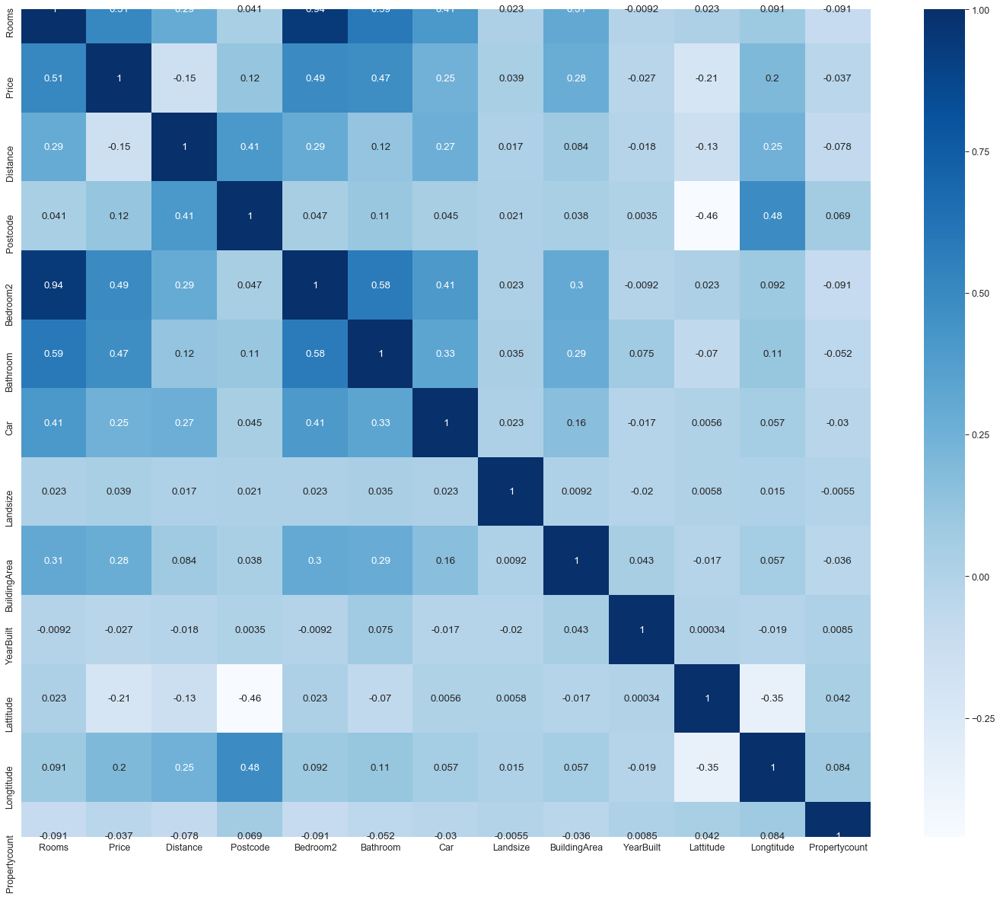

In [76]:
#Heatmap to display all pearson correlations.
plt.figure(figsize=(25,20))
sns.set_context("paper", font_scale=1.4)
data_mx = df.corr()
sns.heatmap(data_mx, annot=True, cmap="Blues")

### This heatmap above shows Pearson correlations. -1 is negative correlation. 1 is positive correlation. 0 is no correlation.

In [77]:
resevoir=df.loc[df["Suburb"] == "Reservoir"]
richmond=df.loc[df["Suburb"] == "Richmond"]
brunswick=df.loc[df["Suburb"] == "Brunswick"]

### Correlations can be inaccurate for all of Melbourne so we are taking heatmaps for the most popular suburbs to find out more accurate results. (Reservoir, Richmond and Brunswick).


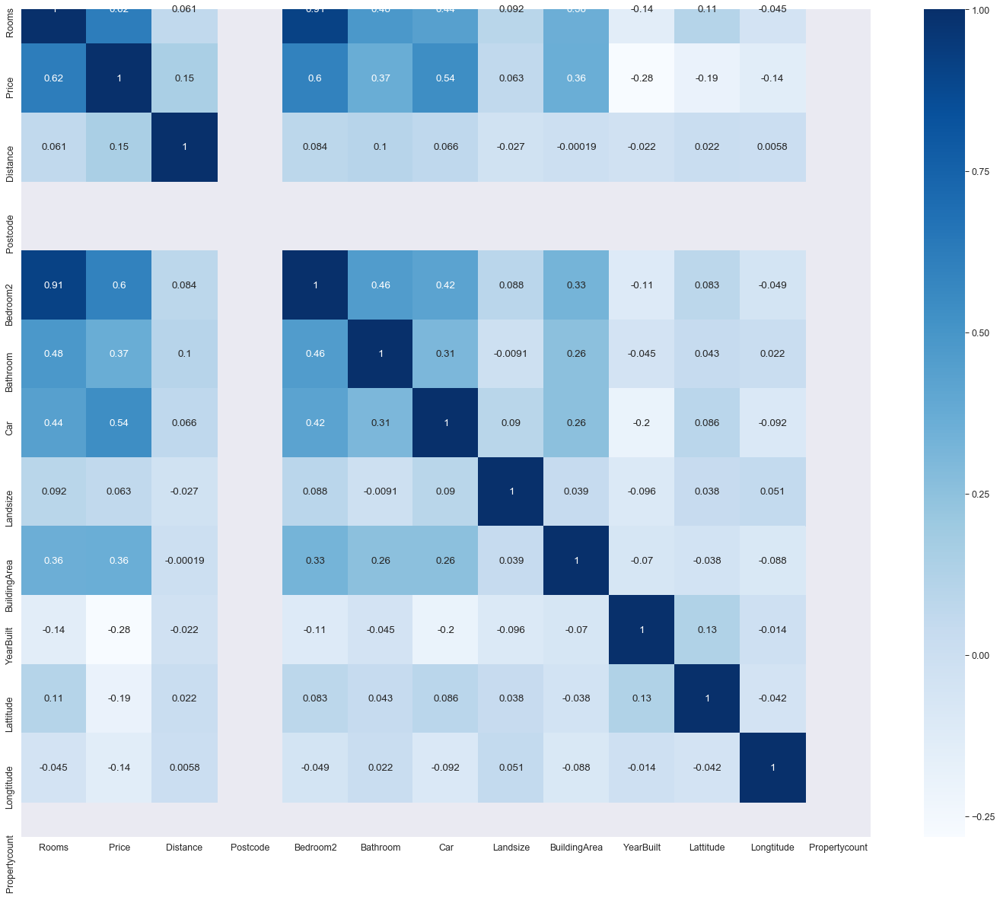

In [78]:
plt.figure(figsize=(25,20))
sns.set_context("paper", font_scale=1.4)
data_mx = resevoir.corr()
sns.heatmap(data_mx, annot=True, cmap="Blues")

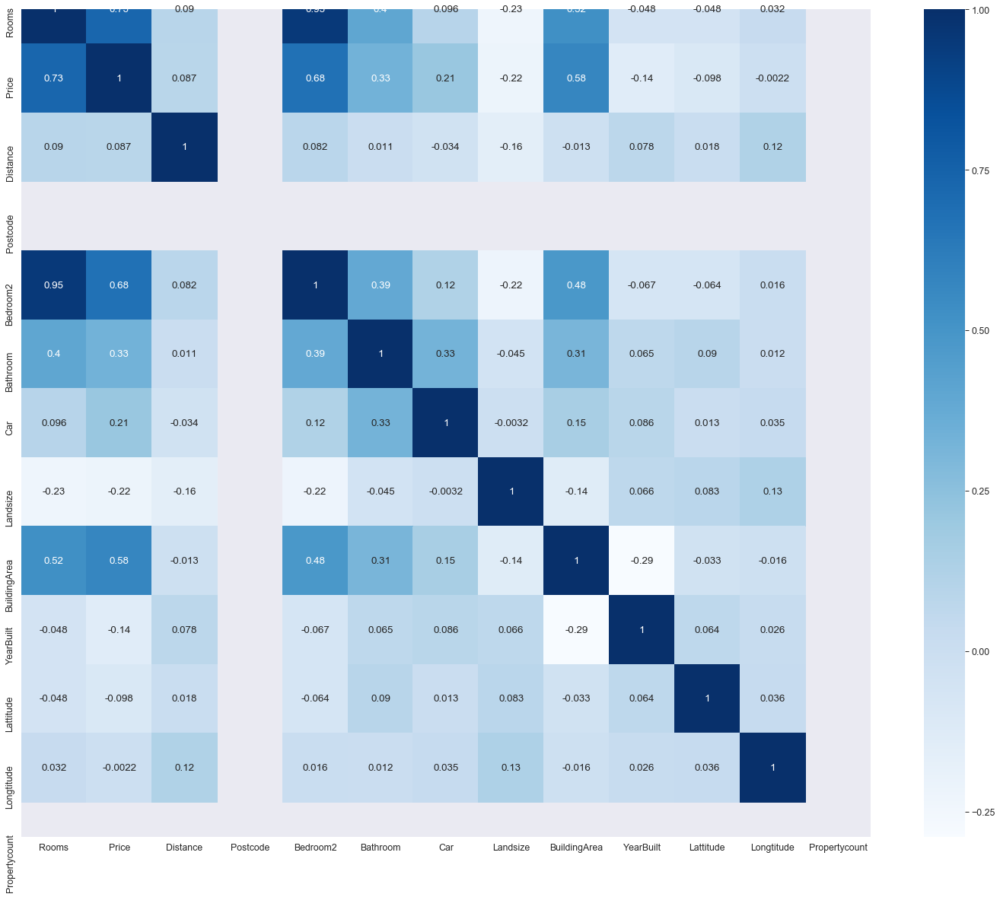

In [79]:
plt.figure(figsize=(25,20))
sns.set_context("paper", font_scale=1.4)
data_mx = richmond.corr()
sns.heatmap(data_mx, annot=True, cmap="Blues")

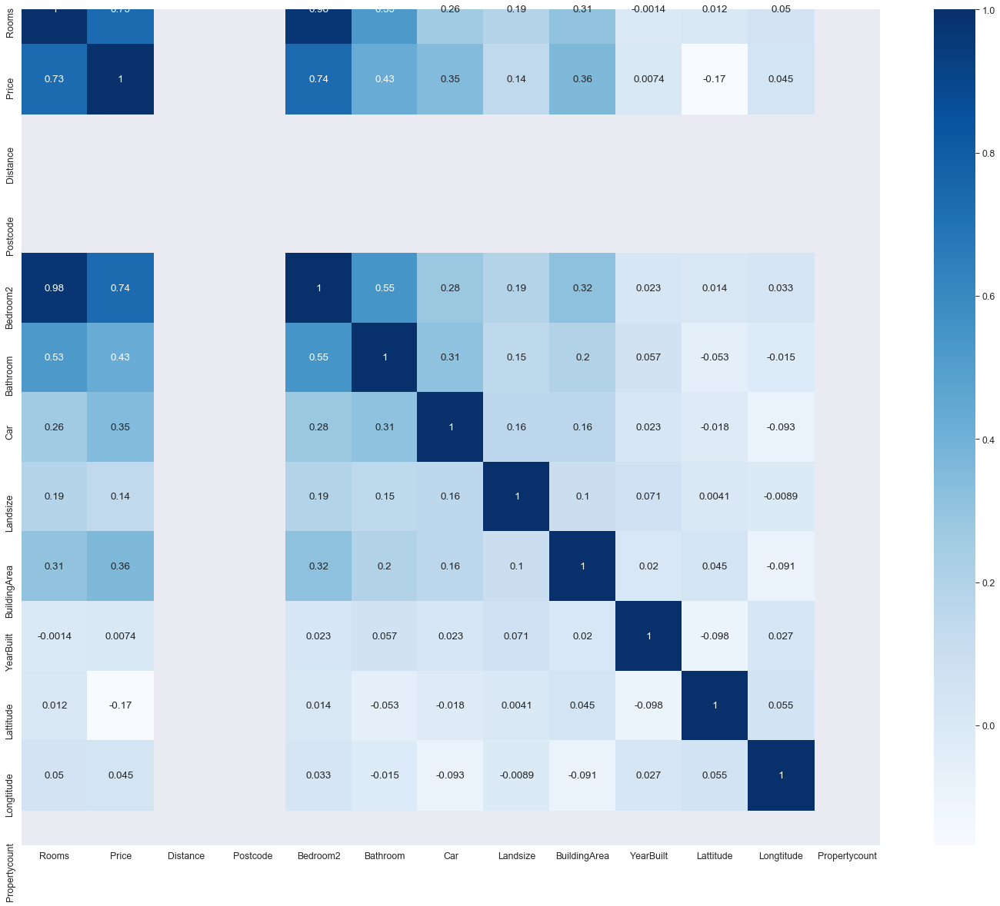

In [80]:
plt.figure(figsize=(25,20))
sns.set_context("paper", font_scale=1.4)
data_mx = brunswick.corr()
sns.heatmap(data_mx, annot=True, cmap="Blues")

### The three heatmaps shown above are for the three highest-selling suburbs for improved results as house prices are different in different areas in Melbourne. The highest-selling suburbs were chosen as they had the highest number of entries in the dataset.

### Pearson's correlations all over Melbourne: the price and the number of bedrooms in a house has a positive correlation of 0.49. The price and building area have a positive correlation of 0.28. The price and the number of bathrooms are positively correlated at 0.47. The most positive amount of correlation observed was with the number of bedrooms and the total number of rooms which was at 0.94, because the more bedrooms, the more rooms in general.

In [81]:
df.columns

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount', 'Month', 'Year',
       'Month/Year'],
      dtype='object')

In [82]:
#Pearson correlations: does price increase when rooms increase? Does price increase with building area?

arr1=np.array(df["Price"])
arr2=np.array(df["Rooms"])
arr3=np.array(df["BuildingArea"])
arr4=np.array(df["Distance"])
arr5=np.array(df["Bedroom2"])
arr6=np.array(df["Bathroom"])
arr7=np.array(df['Car'])
arr8=np.array(df['Landsize'])
arr9=np.array(df['BuildingArea'])
arr10=np.array(df['Propertycount'])
arr11 = np.array(df["YearBuilt"])
arr12 = np.array(df["Date"])

In [83]:
np.corrcoef(arr1, arr2) #Pearson correlation: 0.5
np.corrcoef(arr1, arr3) #Pearson correlation: 0.07
np.corrcoef(arr1, arr4) #Pearson correlation: -0.16
np.corrcoef(arr2, arr5) #Pearson correlation: 0.94
np.corrcoef(arr2, arr3) #Pearson correlation: 0.09
np.corrcoef(arr1, arr11) #Pearson correlation: -0.027.
np.corrcoef(arr2, arr6) #Pearson correlation: 0.59

array([[1.        , 0.59053736],
       [0.59053736, 1.        ]])

In [84]:
#Spearman's rank.

df[["Price", "Rooms"]].corr(method="spearman") #Spearman's rank: 0.56
df[["Price", "BuildingArea"]].corr(method="spearman") #Spearman's rank: 0.44
df[["Price", "Distance"]].corr(method="spearman") #Spearman's rank: -0.11
df[["Rooms", "BuildingArea"]].corr(method="spearman") #Spearman's rank: 0.55

,Rooms,BuildingArea
Rooms,1.000000,0.548053
BuildingArea,0.548053,1.000000


In [85]:
stats.zscore(arr1)
stats.zscore(arr2)
stats.zscore(arr3)
stats.zscore(arr4)
stats.zscore(arr5)
stats.zscore(arr6)
stats.zscore(arr7)
stats.zscore(arr8)
stats.zscore(arr9)
stats.zscore(arr10)

array([-0.7859099 , -0.7859099 , -0.7859099 , ..., -1.03285243,
       -0.2082612 , -0.2082612 ])

In [90]:
mean_price=df["Price"].mean() 
mean_std=df["Price"].std()

df["Price_ZScore"] = (df["Price"] - mean_price)/mean_std

### Above, the numerical attributes were converted to an array format, and the zscores of each were calculated.

In [122]:
px.scatter_mapbox(df, lat="Lattitude", lon="Longtitude", color="Car", mapbox_style="open-street-map", color_continuous_scale=px.colors.cyclical.IceFire, size="Car")

In [135]:
px.scatter_mapbox(df, lat="Lattitude", lon="Longtitude", color="Rooms", mapbox_style="open-street-map", color_continuous_scale=px.colors.cyclical.IceFire, size="Rooms")

In [141]:
px.scatter_mapbox(df, lat="Lattitude", lon="Longtitude", color="Bathroom", mapbox_style="open-street-map", color_continuous_scale=px.colors.cyclical.IceFire, size="Bathroom", hover_name="Suburb")